## **Modified Code of ZeroDCE Tensorflow**

---
Reference
https://keras.io/examples/vision/zero_dce/




*   Zero-Reference Deep Curve Estimation or Zero-DCE 
formulates low-light image enhancement as the task of estimating an image-specific tonal curve with a deep neural network.
*  Zero-DCE takes a low-light image as input and produces high-order tonal curves as its output.
*   Unlike other enhancement methods, zeroDCE is a **non-reference method** that does not require paired images for training.
* It is trained on LOL dataset without enhnaced images.





 




In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# The folder the dataset is located
%cd '/content/drive/MyDrive/FYP/ZeoroDCE/Test_Code2'

/content/drive/MyDrive/FYP/ZeoroDCE/Test_Code2


In [ ]:
from IPython.display import clear_output
!pip install -q tensorflow==2.4.1

In [ ]:
import os
import random
import numpy as np
from glob import glob
from PIL import Image, ImageOps


import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid


import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, losses, optimizers, callbacks


AUTOTUNE = tf.data.AUTOTUNE

In [ ]:
# Set paths for Input and Validation Directories
TRAIN_VAL_IMAGE_DIR = "/content/drive/MyDrive/FYP/ZeoroDCE/LOLdataset_All/our485/LOL_MIRNET_Enhnace_our485"
TEST_IMAGE_DIR = "/content/drive/MyDrive/FYP/ZeoroDCE/LOLdataset_All/eval15/LOL_MIRNET_Enhnace_Eval15"

In [ ]:
# Experiment Configs
SEED = 10
random.seed(SEED)
tf.random.set_seed(SEED)


IMAGE_SIZE = 256
MAX_TRAIN_IMAGES = 400
BATCH_SIZE = 16 
LEARNING_RATE = 1e-4
LOG_INTERVALS = 10
EPOCHS = 50

In [ ]:
train_val_image_files = glob(os.path.join(TRAIN_VAL_IMAGE_DIR, "*.png"))
test_image_files = glob(os.path.join(TEST_IMAGE_DIR, "*.png"))
train_image_files = train_val_image_files[:MAX_TRAIN_IMAGES]
val_image_files = train_val_image_files[MAX_TRAIN_IMAGES:]

print("Number of Training Images:", len(train_image_files))
print("Number of Validation Images:", len(val_image_files))
print("Number of Test Images from LOL Dataset:", len(test_image_files))

Number of Training Images: 200
Number of Validation Images: 285
Number of Test Images from LOL Dataset: 15


In [ ]:
def load_data(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_png(image, channels=3)
    image = tf.image.resize(images=image, size=[IMAGE_SIZE, IMAGE_SIZE])
    image = image / 255.0
    return image


def get_dataset(images):
    dataset = tf.data.Dataset.from_tensor_slices((images))
    dataset = dataset.map(load_data, num_parallel_calls=AUTOTUNE)
    dataset = dataset.batch(BATCH_SIZE, drop_remainder=True)
    dataset = dataset.prefetch(AUTOTUNE)
    
    return dataset


train_dataset = get_dataset(train_image_files)
val_dataset = get_dataset(val_image_files)

In [ ]:
print("Train Data Elements:", train_dataset.element_spec)
print("Validation Data Elements:", val_dataset.element_spec)

Train Data Elements: TensorSpec(shape=(16, 256, 256, 3), dtype=tf.float32, name=None)
Validation Data Elements: TensorSpec(shape=(16, 256, 256, 3), dtype=tf.float32, name=None)


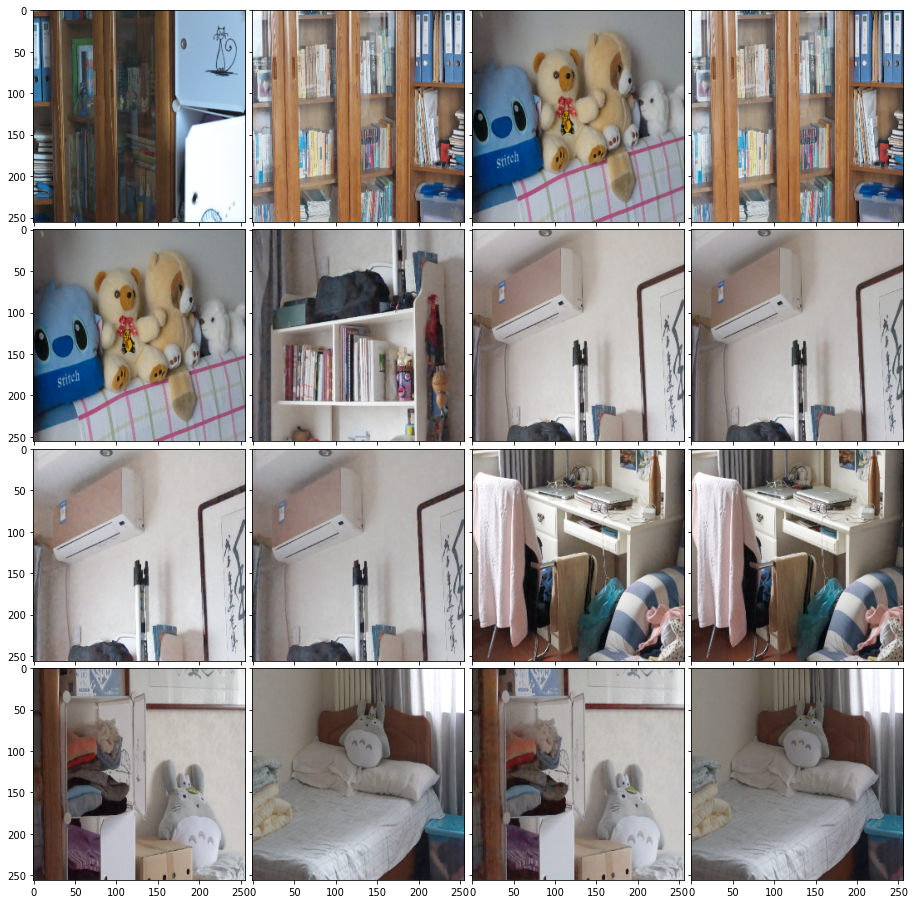

In [ ]:
images = next(iter(train_dataset)).numpy()
fig = plt.figure(figsize=(16, 16))
grid = ImageGrid(fig, 111, nrows_ncols=(4, 4), axes_pad=0.1)
random_images = images[np.random.choice(np.arange(images.shape[0]), 16)]
for ax, image in zip(grid, images):
    image = image * 255.0
    ax.imshow(image.astype(np.uint8))
plt.title("Sample Images from Tiny-NeRF Data")
plt.show()

## **Model Developmemt**

The Model Architecture
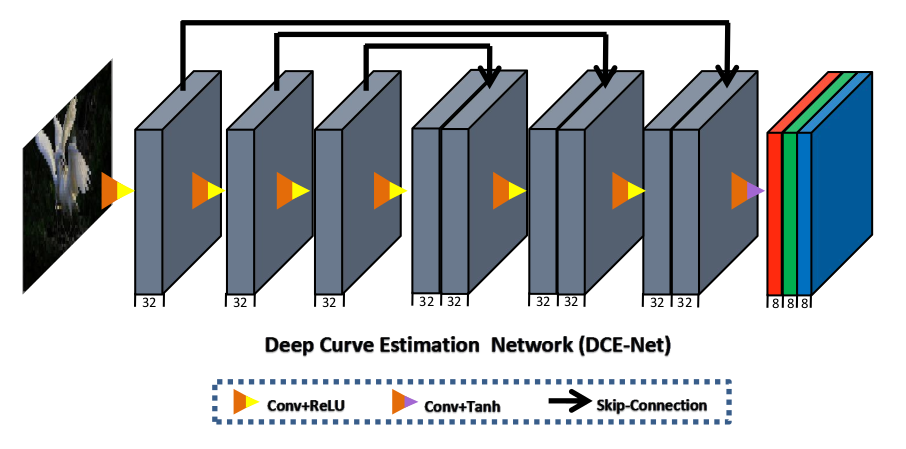

In [ ]:
def build_dce_net(image_size=None) -> keras.Model:
    input_image = keras.Input(shape=[image_size, image_size, 3])
    conv1 = layers.Conv2D(
        32, (3, 3), strides=(1, 1), activation="relu", padding="same"
    )(input_image)
    conv2 = layers.Conv2D(
        32, (3, 3), strides=(1, 1), activation="relu", padding="same"
    )(conv1)
    conv3 = layers.Conv2D(
        32, (3, 3), strides=(1, 1), activation="relu", padding="same"
    )(conv2)
    conv4 = layers.Conv2D(
        32, (3, 3), strides=(1, 1), activation="relu", padding="same"
    )(conv3)
    int_con1 = layers.Concatenate(axis=-1)([conv4, conv3])
    conv5 = layers.Conv2D(
        32, (3, 3), strides=(1, 1), activation="relu", padding="same"
    )(int_con1)
    int_con2 = layers.Concatenate(axis=-1)([conv5, conv2])
    conv6 = layers.Conv2D(
        32, (3, 3), strides=(1, 1), activation="relu", padding="same"
    )(int_con2)
    int_con3 = layers.Concatenate(axis=-1)([conv6, conv1])
    x_r = layers.Conv2D(24, (3, 3), strides=(1, 1), activation="tanh", padding="same")(
        int_con3
    )
    return keras.Model(inputs=input_image, outputs=x_r)

**Loss Functions**

One of the advantage I saw in this model is;
It is light weight and easy to try out with our own loss functions

In [ ]:
def color_constancy_loss(x):
    mean_rgb = tf.reduce_mean(x, axis=(1, 2), keepdims=True)
    mean_red = mean_rgb[:, :, :, 0]
    mean_green = mean_rgb[:, :, :, 1]
    mean_blue = mean_rgb[:, :, :, 2]
    diff_red_green = tf.square(mean_red - mean_green)
    diff_red_blue = tf.square(mean_red - mean_blue)
    diff_green_blue = tf.square(mean_blue - mean_green)
    return tf.sqrt(
        tf.square(diff_red_green) + tf.square(diff_red_blue) + tf.square(diff_green_blue)
    )

In [ ]:
def exposure_loss(x, mean_val=0.6):
    x = tf.reduce_mean(x, axis=3, keepdims=True)
    mean = tf.nn.avg_pool2d(x, ksize=16, strides=16, padding="VALID")
    return tf.reduce_mean(tf.square(mean - mean_val))

In [ ]:
def illumination_smoothness_loss(x):
    batch_size = tf.shape(x)[0]
    height_x = tf.shape(x)[1]
    width_x = tf.shape(x)[2]
    count_height = (tf.shape(x)[2] - 1) * tf.shape(x)[3]
    count_width = tf.shape(x)[2] * (tf.shape(x)[3] - 1)
    height_total_variance = tf.reduce_sum(
        tf.square((x[:, 1:, :, :] - x[:, : height_x - 1, :, :]))
    )
    width_total_variance = tf.reduce_sum(
        tf.square((x[:, :, 1:, :] - x[:, :, : width_x - 1, :]))
    )
    batch_size = tf.cast(batch_size, dtype=tf.float32)
    count_height = tf.cast(count_height, dtype=tf.float32)
    count_width = tf.cast(count_width, dtype=tf.float32)
    return 2 * (
        height_total_variance / count_height + width_total_variance / count_width
    ) / batch_size

In [ ]:
class SpatialConsistencyLoss(losses.Loss):
    def __init__(self, **kwargs):
        super(SpatialConsistencyLoss, self).__init__(reduction="none")

        self.left_kernel = tf.constant(
            [[[[0, 0, 0]], [[-1, 1, 0]], [[0, 0, 0]]]], dtype=tf.float32
        )
        self.right_kernel = tf.constant(
            [[[[0, 0, 0]], [[0, 1, -1]], [[0, 0, 0]]]], dtype=tf.float32
        )
        self.up_kernel = tf.constant(
            [[[[0, -1, 0]], [[0, 1, 0]], [[0, 0, 0]]]], dtype=tf.float32
        )
        self.down_kernel = tf.constant(
            [[[[0, 0, 0]], [[0, 1, 0]], [[0, -1, 0]]]], dtype=tf.float32
        )

    def call(self, y_true, y_pred):

        original_mean = tf.reduce_mean(y_true, 3, keepdims=True)
        enhanced_mean = tf.reduce_mean(y_pred, 3, keepdims=True)
        original_pool = tf.nn.avg_pool2d(
            original_mean, ksize=4, strides=4, padding="VALID"
        )
        enhanced_pool = tf.nn.avg_pool2d(
            enhanced_mean, ksize=4, strides=4, padding="VALID"
        )

        d_original_left = tf.nn.conv2d(
            original_pool, self.left_kernel, strides=[1, 1, 1, 1], padding="SAME"
        )
        d_original_right = tf.nn.conv2d(
            original_pool, self.right_kernel, strides=[1, 1, 1, 1], padding="SAME"
        )
        d_original_up = tf.nn.conv2d(
            original_pool, self.up_kernel, strides=[1, 1, 1, 1], padding="SAME"
        )
        d_original_down = tf.nn.conv2d(
            original_pool, self.down_kernel, strides=[1, 1, 1, 1], padding="SAME"
        )

        d_enhanced_left = tf.nn.conv2d(
            enhanced_pool, self.left_kernel, strides=[1, 1, 1, 1], padding="SAME"
        )
        d_enhanced_right = tf.nn.conv2d(
            enhanced_pool, self.right_kernel, strides=[1, 1, 1, 1], padding="SAME"
        )
        d_enhanced_up = tf.nn.conv2d(
            enhanced_pool, self.up_kernel, strides=[1, 1, 1, 1], padding="SAME"
        )
        d_enhanced_down = tf.nn.conv2d(
            enhanced_pool, self.down_kernel, strides=[1, 1, 1, 1], padding="SAME"
        )

        d_left = tf.square(d_original_left - d_enhanced_left)
        d_right = tf.square(d_original_right - d_enhanced_right)
        d_up = tf.square(d_original_up - d_enhanced_up)
        d_down = tf.square(d_original_down - d_enhanced_down)
        return d_left + d_right + d_up + d_down

In [ ]:
class ZeroDCE(keras.Model):
    def __init__(self, **kwargs):
        super(ZeroDCE, self).__init__(**kwargs)
        self.dce_model = build_dce_net()

    def compile(self, learning_rate, **kwargs):
        super(ZeroDCE, self).compile(**kwargs)
        self.optimizer = optimizers.Adam(learning_rate=learning_rate)
        self.spatial_constancy_loss = SpatialConsistencyLoss(reduction="none")
    
    def summary(self, *args, **kwargs):
        self.dce_model.summary(*args, **kwargs)

    def get_enhanced_image(self, data, output):
        x = data
        for i in range(0, 3 * 8, 3):
            r = output[:, :, :, i: i + 3]
            x = x + r * (tf.square(x) - x)
        return x

    def call(self, data):
        dce_net_output = self.dce_model(data)
        return self.get_enhanced_image(data, dce_net_output)

    def compute_losses(self, data, output):
        enhanced_image = self.get_enhanced_image(data, output)
        loss_illumination = 200 * illumination_smoothness_loss(output)
        loss_spatial_constancy = tf.reduce_mean(
            self.spatial_constancy_loss(enhanced_image, data)
        )
        loss_color_constancy = 5 * tf.reduce_mean(color_constancy_loss(enhanced_image))
        loss_exposure = 10 * tf.reduce_mean(exposure_loss(enhanced_image))
        total_loss = (
            loss_illumination
            + loss_spatial_constancy
            + loss_color_constancy
            + loss_exposure
        )
        return {
            "total_loss": total_loss,
            "illumination_smoothness_loss": loss_illumination,
            "spatial_constancy_loss": loss_spatial_constancy,
            "color_constancy_loss": loss_color_constancy,
            "exposure_loss": loss_exposure,
        }

    def train_step(self, data):
        with tf.GradientTape() as tape:
            output = self.dce_model(data)
            losses = self.compute_losses(data, output)
        gradients = tape.gradient(
            losses["total_loss"], self.dce_model.trainable_weights
        )
        self.optimizer.apply_gradients(zip(gradients, self.dce_model.trainable_weights))
        return losses

    def test_step(self, data):
        output = self.dce_model(data)
        return self.compute_losses(data, output)

    def save_weights(self, filepath, overwrite=True, save_format=None, options=None):
        """While saving the weights, we simply save the weights of the DCE-Net"""
        self.dce_model.save_weights(
            filepath, overwrite=overwrite, save_format=save_format, options=options
        )

    def load_weights(self, filepath, by_name=False, skip_mismatch=False, options=None):
        """While loading the weights, we simply load the weights of the DCE-Net"""
        self.dce_model.load_weights(
            filepath=filepath,
            by_name=by_name,
            skip_mismatch=skip_mismatch,
            options=options,
        )

In [ ]:
zero_dce_model = ZeroDCE()
zero_dce_model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, None, None, 3 896         input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, None, None, 3 9248        conv2d[0][0]                     
__________________________________________________________________________________________________
concatenate (Concatenate)       (None, None, None, 6 0           conv2d_1[0][0]                   
                                                                 conv2d[0][0]                 

In [ ]:
def plot_results(images, titles, figure_size=(12, 12)):
    fig = plt.figure(figsize=figure_size)
    for i in range(len(images)):
        fig.add_subplot(1, len(images), i + 1).set_title(titles[i])
        _ = plt.imshow(images[i])
        plt.axis("off")
    plt.show()


def infer(original_image):
    image = keras.preprocessing.image.img_to_array(original_image)
    image = image[:, :, :3] if image.shape[-1] > 3 else image
    image = image.astype("float32") / 255.0
    image = np.expand_dims(image, axis=0)
    output_image = zero_dce_model(image)
    output_image = tf.cast((output_image[0, :, :, :] * 255), dtype=np.uint8)
    output_image = Image.fromarray(output_image.numpy())
    return output_image

**Callbacks**

In [ ]:
class LogPredictionCallback(callbacks.Callback):
    
    def __init__(self, image_files, log_interval, *args, **kwargs):
        super().__init__(*args, **kwargs)
        self.image_files = image_files
        self.log_interval = log_interval
    
    def on_epoch_end(self, epoch, logs=None):
        if epoch % self.log_interval == 0: 
            for image_file in self.image_files:
                original_image = Image.open(image_file)
                enhanced_image = infer(original_image)
                plot_results(
                    [original_image, enhanced_image],
                    ["Input_Image","Enhanced_Image"],
                    (15, 7),
                )

## **Trainning**

**Save best model callback**

When the experiment is run a specific folder is created named from the current date and time
All the models are saved in it for future reference

In [ ]:
from datetime import datetime

model_save_folder = datetime.now().strftime("%Y%m%d_%H%M%S")
model_save_dir = f'models/{model_save_folder}'
os.mkdir(model_save_dir)
save_best_model_checkpoint = keras.callbacks.ModelCheckpoint(model_save_dir+'/model-{epoch:03d}.h5',monitor='total_loss',save_best_only=True,mode='auto')

Epoch 1/50
12/12 [==============================] - 142s 12s/step - total_loss: 47.5420 - illumination_smoothness_loss: 47.0567 - spatial_constancy_loss: 8.9422e-04 - color_constancy_loss: 0.0704 - exposure_loss: 0.4139 - val_total_loss: 36.6783 - val_illumination_smoothness_loss: 35.6844 - val_spatial_constancy_loss: 2.8021e-04 - val_color_constancy_loss: 0.0771 - val_exposure_loss: 0.9165


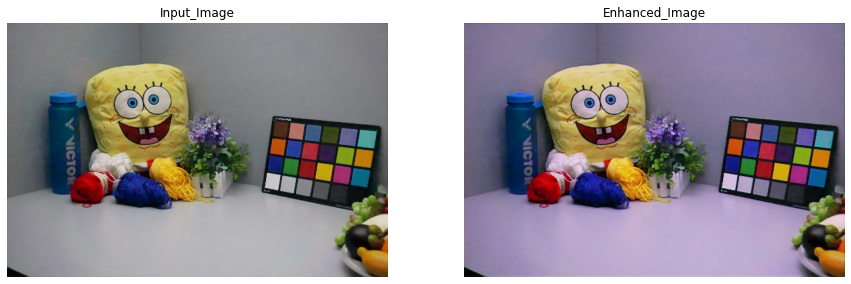

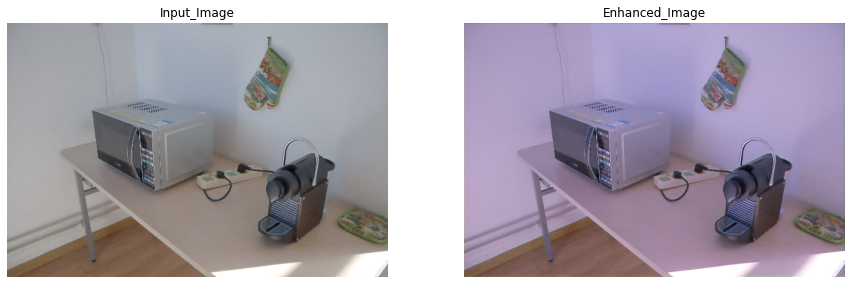

Epoch 2/50
12/12 [==============================] - 125s 11s/step - total_loss: 34.7997 - illumination_smoothness_loss: 34.3486 - spatial_constancy_loss: 0.0012 - color_constancy_loss: 0.0411 - exposure_loss: 0.4088 - val_total_loss: 28.8310 - val_illumination_smoothness_loss: 27.8676 - val_spatial_constancy_loss: 3.3931e-04 - val_color_constancy_loss: 0.0523 - val_exposure_loss: 0.9108
Epoch 3/50
12/12 [==============================] - 123s 10s/step - total_loss: 26.1924 - illumination_smoothness_loss: 25.7513 - spatial_constancy_loss: 0.0012 - color_constancy_loss: 0.0335 - exposure_loss: 0.4063 - val_total_loss: 23.4160 - val_illumination_smoothness_loss: 22.4568 - val_spatial_constancy_loss: 2.8533e-04 - val_color_constancy_loss: 0.0424 - val_exposure_loss: 0.9165
Epoch 4/50
12/12 [==============================] - 124s 11s/step - total_loss: 20.4685 - illumination_smoothness_loss: 20.0294 - spatial_constancy_loss: 9.1466e-04 - color_constancy_loss: 0.0323 - exposure_loss: 0.4058 

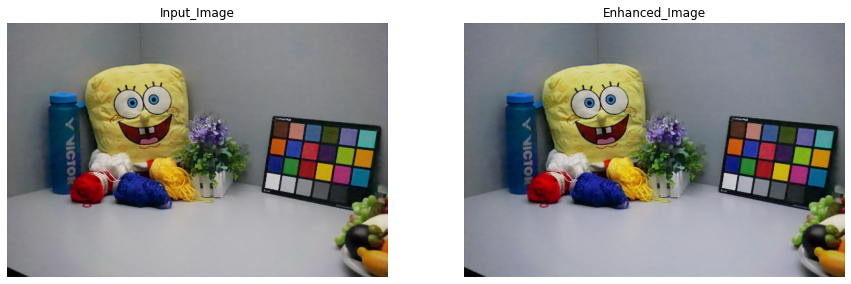

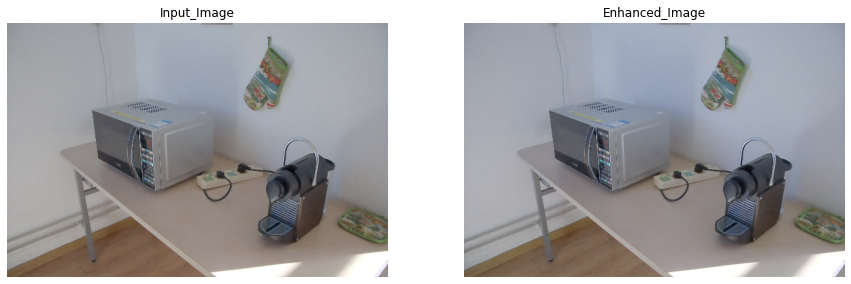

Epoch 12/50
12/12 [==============================] - 123s 10s/step - total_loss: 6.4288 - illumination_smoothness_loss: 6.0013 - spatial_constancy_loss: 2.5227e-04 - color_constancy_loss: 0.0237 - exposure_loss: 0.4036 - val_total_loss: 8.7409 - val_illumination_smoothness_loss: 7.7625 - val_spatial_constancy_loss: 9.2563e-05 - val_color_constancy_loss: 0.0456 - val_exposure_loss: 0.9326
Epoch 13/50
12/12 [==============================] - 132s 11s/step - total_loss: 5.8787 - illumination_smoothness_loss: 5.4526 - spatial_constancy_loss: 2.5377e-04 - color_constancy_loss: 0.0232 - exposure_loss: 0.4027 - val_total_loss: 8.1739 - val_illumination_smoothness_loss: 7.1972 - val_spatial_constancy_loss: 9.9718e-05 - val_color_constancy_loss: 0.0463 - val_exposure_loss: 0.9303
Epoch 14/50
12/12 [==============================] - 129s 11s/step - total_loss: 5.4117 - illumination_smoothness_loss: 4.9870 - spatial_constancy_loss: 2.6292e-04 - color_constancy_loss: 0.0228 - exposure_loss: 0.4016

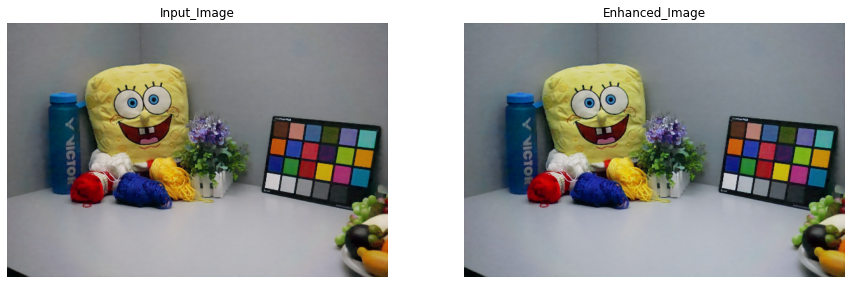

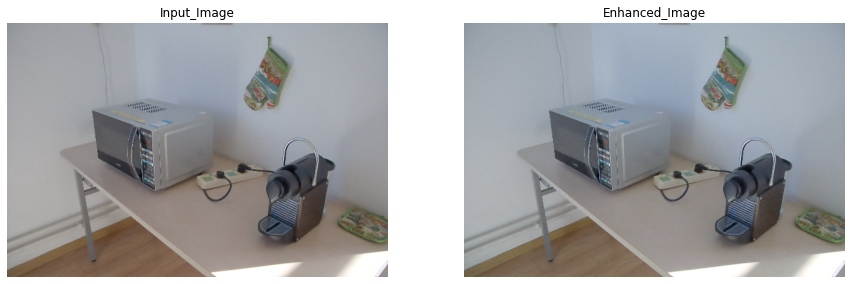

Epoch 22/50
12/12 [==============================] - 124s 11s/step - total_loss: 3.2285 - illumination_smoothness_loss: 2.8155 - spatial_constancy_loss: 5.5288e-04 - color_constancy_loss: 0.0217 - exposure_loss: 0.3907 - val_total_loss: 5.0134 - val_illumination_smoothness_loss: 4.0697 - val_spatial_constancy_loss: 3.1391e-04 - val_color_constancy_loss: 0.0498 - val_exposure_loss: 0.8935
Epoch 23/50
12/12 [==============================] - 125s 11s/step - total_loss: 3.0622 - illumination_smoothness_loss: 2.6506 - spatial_constancy_loss: 6.0427e-04 - color_constancy_loss: 0.0217 - exposure_loss: 0.3893 - val_total_loss: 4.7899 - val_illumination_smoothness_loss: 3.8503 - val_spatial_constancy_loss: 3.4994e-04 - val_color_constancy_loss: 0.0501 - val_exposure_loss: 0.8891
Epoch 24/50
12/12 [==============================] - 129s 11s/step - total_loss: 2.9086 - illumination_smoothness_loss: 2.4984 - spatial_constancy_loss: 6.5400e-04 - color_constancy_loss: 0.0216 - exposure_loss: 0.3880

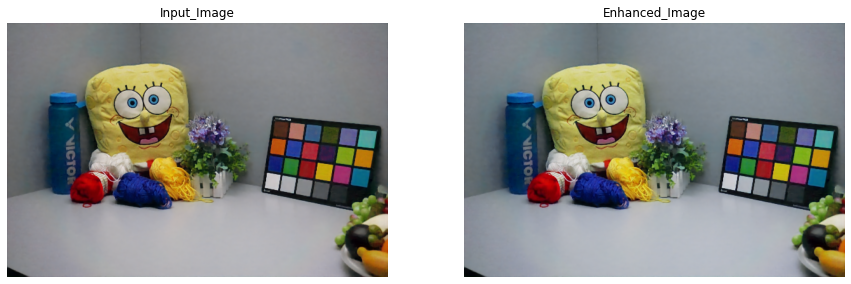

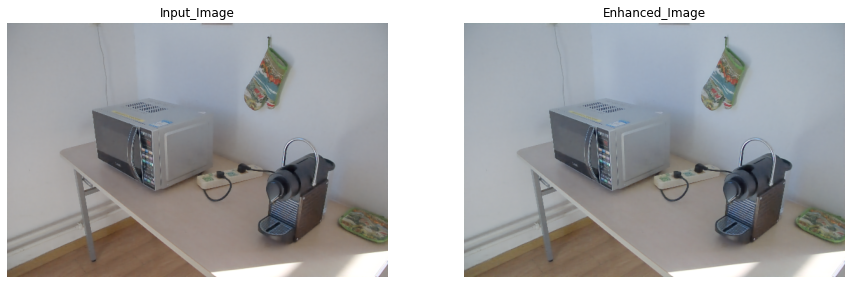

Epoch 32/50
12/12 [==============================] - 125s 11s/step - total_loss: 1.9858 - illumination_smoothness_loss: 1.5860 - spatial_constancy_loss: 0.0011 - color_constancy_loss: 0.0207 - exposure_loss: 0.3780 - val_total_loss: 3.2748 - val_illumination_smoothness_loss: 2.3700 - val_spatial_constancy_loss: 7.7033e-04 - val_color_constancy_loss: 0.0546 - val_exposure_loss: 0.8494
Epoch 33/50
12/12 [==============================] - 129s 11s/step - total_loss: 1.9028 - illumination_smoothness_loss: 1.5043 - spatial_constancy_loss: 0.0012 - color_constancy_loss: 0.0205 - exposure_loss: 0.3768 - val_total_loss: 3.1572 - val_illumination_smoothness_loss: 2.2565 - val_spatial_constancy_loss: 8.3151e-04 - val_color_constancy_loss: 0.0550 - val_exposure_loss: 0.8449
Epoch 34/50
12/12 [==============================] - 124s 11s/step - total_loss: 1.8251 - illumination_smoothness_loss: 1.4279 - spatial_constancy_loss: 0.0012 - color_constancy_loss: 0.0203 - exposure_loss: 0.3756 - val_total

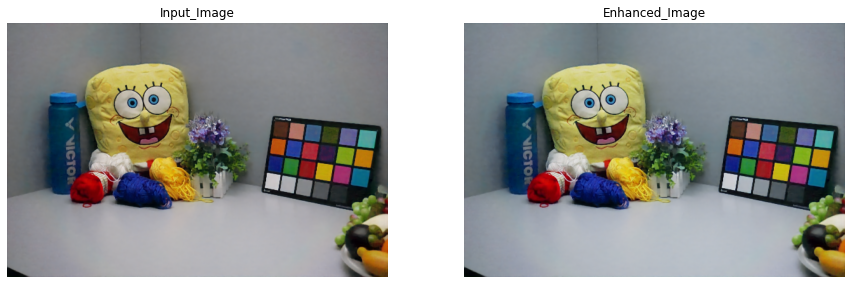

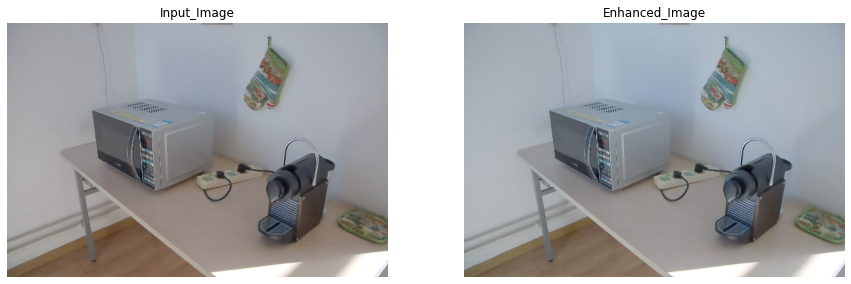

Epoch 42/50
12/12 [==============================] - 126s 11s/step - total_loss: 1.3639 - illumination_smoothness_loss: 0.9764 - spatial_constancy_loss: 0.0019 - color_constancy_loss: 0.0193 - exposure_loss: 0.3663 - val_total_loss: 2.3814 - val_illumination_smoothness_loss: 1.5123 - val_spatial_constancy_loss: 0.0014 - val_color_constancy_loss: 0.0613 - val_exposure_loss: 0.8063
Epoch 43/50
12/12 [==============================] - 128s 11s/step - total_loss: 1.3213 - illumination_smoothness_loss: 0.9349 - spatial_constancy_loss: 0.0020 - color_constancy_loss: 0.0192 - exposure_loss: 0.3652 - val_total_loss: 2.3199 - val_illumination_smoothness_loss: 1.4542 - val_spatial_constancy_loss: 0.0015 - val_color_constancy_loss: 0.0620 - val_exposure_loss: 0.8021
Epoch 44/50
12/12 [==============================] - 128s 11s/step - total_loss: 1.2821 - illumination_smoothness_loss: 0.8969 - spatial_constancy_loss: 0.0020 - color_constancy_loss: 0.0190 - exposure_loss: 0.3642 - val_total_loss: 2

In [ ]:
zero_dce_model.compile(learning_rate=LEARNING_RATE)
history = zero_dce_model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=EPOCHS,
    callbacks=[
        LogPredictionCallback(image_files=random.sample(val_image_files, 2),log_interval=LOG_INTERVALS),
        save_best_model_checkpoint
    ]
)

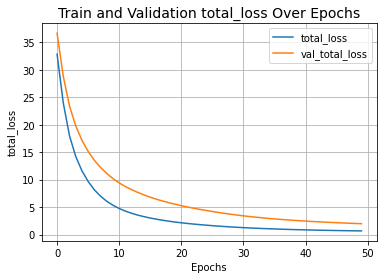

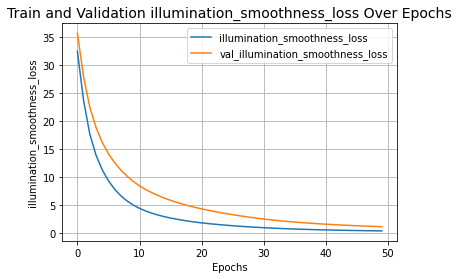

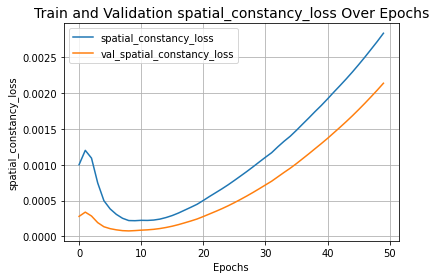

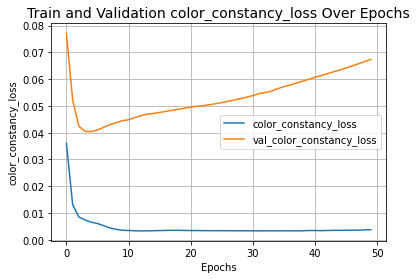

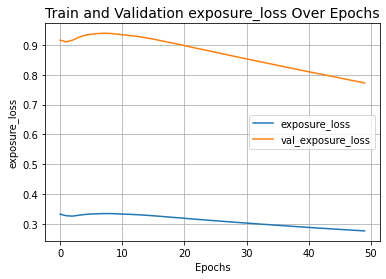

In [ ]:
def plot_result(item):
    plt.plot(history.history[item], label=item)
    plt.plot(history.history["val_" + item], label="val_" + item)
    plt.xlabel("Epochs")
    plt.ylabel(item)
    plt.title("Train and Validation {} Over Epochs".format(item), fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()


plot_result("total_loss")
plot_result("illumination_smoothness_loss")
plot_result("spatial_constancy_loss")
plot_result("color_constancy_loss")
plot_result("exposure_loss")

In [ ]:
# Loss Data are saved for further analysis
import json

with open(os.path.join('ZERODCE_results.json'), "w") as outfile:
    json.dump(history.history, outfile)

In [ ]:
model_save_dir

'models/20221225_035025'

## **Inference**

In [ ]:
# traget director
target_val_image_dir = r'/content/drive/MyDrive/FYP/ZeoroDCE/LOLdataset_All/eval15/high'

In [ ]:
def find_target_img_path(test_img_file):
  test_img_filename = os.path.basename(test_img_file)
  target_img_path = os.path.join(target_val_image_dir,test_img_filename)
  return target_img_path


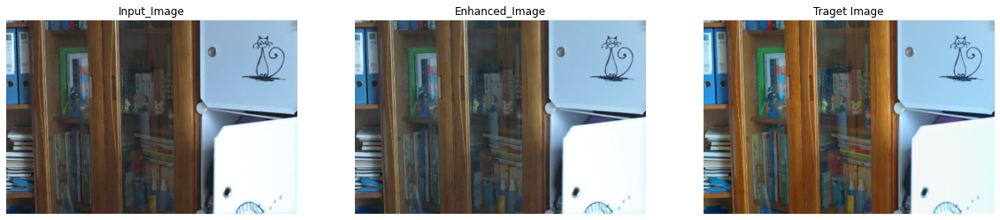

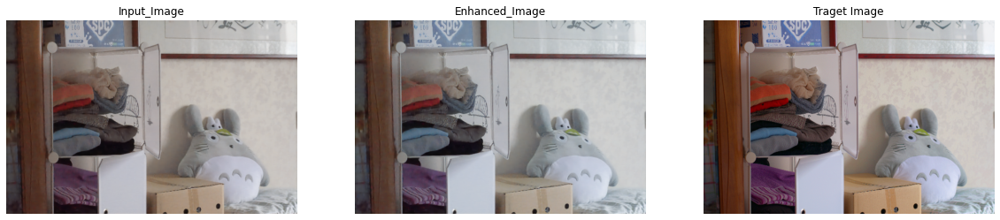

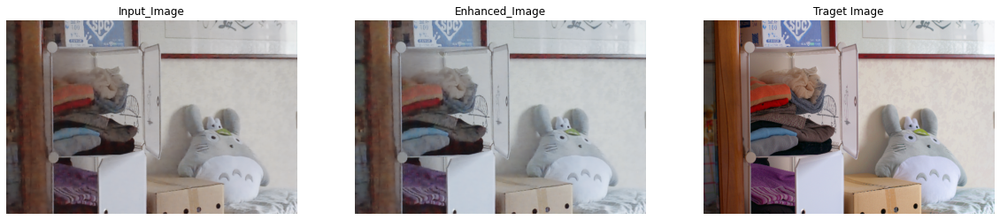

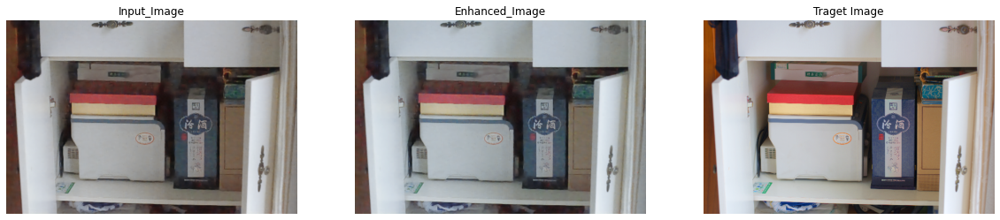

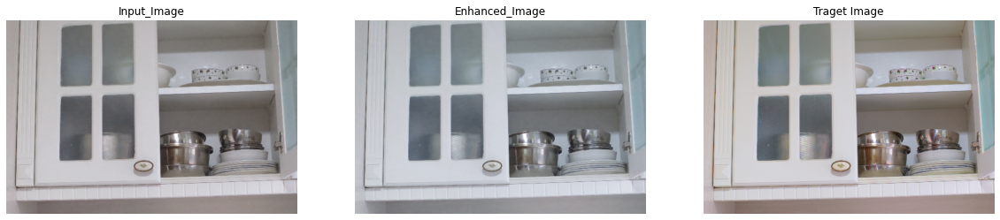

...

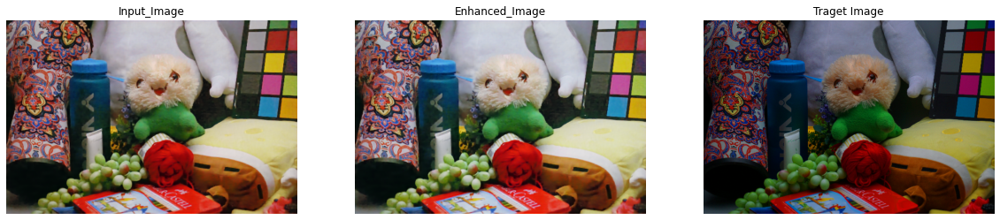

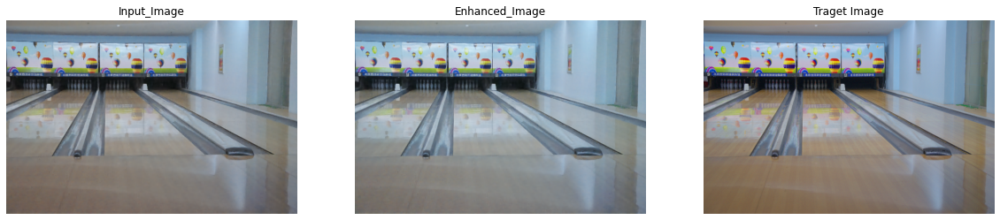

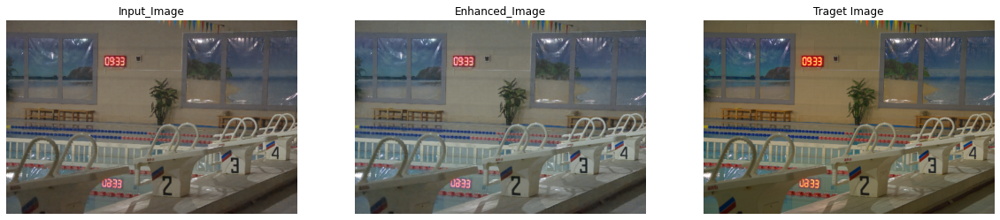

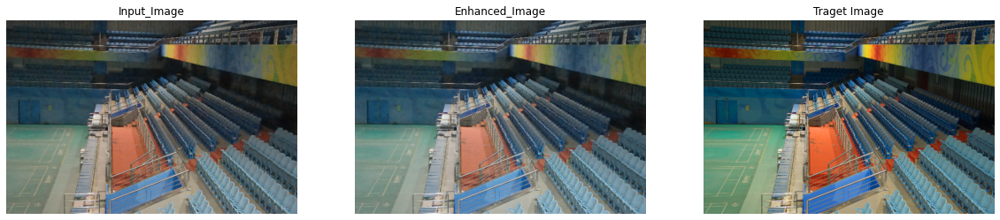

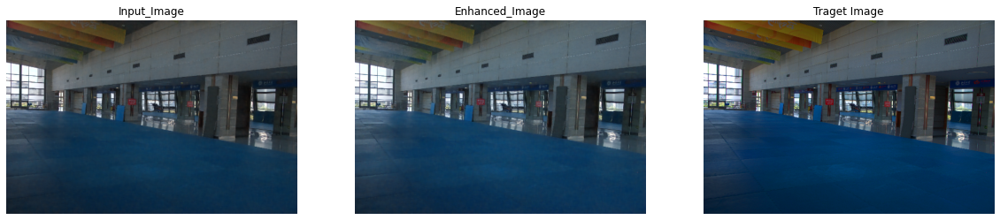

In [ ]:
n_show = 25
for c,image_file in enumerate(test_image_files):
    if c==n_show:
      break

    target_img_path = find_target_img_path(image_file)
    target_image = Image.open(target_img_path)

    original_image = Image.open(image_file)
    enhanced_image = infer(original_image)
    plot_results(
        [original_image, enhanced_image, target_image],
        ["Input_Image","Enhanced_Image","Traget Image"],
        (20, 12),
    )